In [1]:
import geopandas as gpd
import pandas as pd

In [2]:
#import LA environmental justice scores 
df = pd.read_csv(
'Data/EJSM_Scores/EJSM_Scores (1).csv' ,
dtype={
    'Tract_1':str
})

In [3]:
#add number zero leading the FIPS code for merging the data with the census tract data
df['Tract_1'] = df['Tract_1'].str.zfill(11)
df.head()

,OBJECTID,Tract_1,CIscore,HazScore,HealthScore,SVscore,CCVscore,Shape__Area,Shape__Length
0,1,06037920336,10,3,1,4,2,2.438560e+06,8124.373091
1,2,06037920044,4,1,1,1,1,1.470811e+06,5545.298452
2,3,06037573003,13,5,3,3,2,6.528168e+05,3310.743793
3,4,06037571704,13,3,2,4,4,6.994011e+05,4113.477175
4,5,06037570403,17,5,3,5,4,8.317839e+05,3887.000394


In [4]:
#import 2012 census data
tracts=gpd.read_file('Data/CensusData2012/census-tracts-2012.geojson')
print(tracts)

                     kind  external_id         name  \
0     Census Tract (2012)  06037101110  06037101110   
1     Census Tract (2012)  06037101122  06037101122   
2     Census Tract (2012)  06037101210  06037101210   
3     Census Tract (2012)  06037101220  06037101220   
4     Census Tract (2012)  06037101300  06037101300   
...                   ...          ...          ...   
2341  Census Tract (2012)  06037980031  06037980031   
2342  Census Tract (2012)  06037980033  06037980033   
2343  Census Tract (2012)  06037990100  06037990100   
2344  Census Tract (2012)  06037990200  06037990200   
2345  Census Tract (2012)  06037990300  06037990300   

                               slug                                    set  \
0     06037101110-census-tract-2012  /1.0/boundary-set/census-tracts-2012/   
1     06037101122-census-tract-2012  /1.0/boundary-set/census-tracts-2012/   
2     06037101210-census-tract-2012  /1.0/boundary-set/census-tracts-2012/   
3     06037101220-census-tr

In [5]:
#list column names
list(tracts)

['kind',
 'external_id',
 'name',
 'slug',
 'set',
 'metadata',
 'resource_uri',
 'geometry']

In [6]:
#drop columns
columns_to_drop = ['set','kind','resource_uri','metadata']

In [7]:
#read columns 
tracts.head()

,kind,external_id,name,slug,set,metadata,resource_uri,geometry
0,Census Tract (2012),06037101110,06037101110,06037101110-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2594737', 'NAME': '1011.10',...",/1.0/boundary/06037101110-census-tract-2012/,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007..."
1,Census Tract (2012),06037101122,06037101122,06037101122-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2677213', 'NAME': '1011.22',...",/1.0/boundary/06037101122-census-tract-2012/,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031..."
2,Census Tract (2012),06037101210,06037101210,06037101210-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2529724', 'NAME': '1012.10',...",/1.0/boundary/06037101210-census-tract-2012/,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859..."
3,Census Tract (2012),06037101220,06037101220,06037101220-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2516085', 'NAME': '1012.20',...",/1.0/boundary/06037101220-census-tract-2012/,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859..."
4,Census Tract (2012),06037101300,06037101300,06037101300-census-tract-2012,/1.0/boundary-set/census-tracts-2012/,"{'INTPTLAT': '+34.2487732', 'NAME': '1013', 'I...",/1.0/boundary/06037101300-census-tract-2012/,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719..."


In [8]:
#drop columns from tracts data
tracts = tracts.drop(columns_to_drop,axis=1)

In [9]:
tracts.info(verbose=True, null_counts=True)

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2346 entries, 0 to 2345
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   external_id  2346 non-null   object  
 1   name         2346 non-null   object  
 2   slug         2346 non-null   object  
 3   geometry     2346 non-null   geometry
dtypes: geometry(1), object(3)
memory usage: 73.4+ KB


In [10]:
#isolate the FIPS code and geometry column to match with the EJSM data
tracts = tracts[['name','geometry']]
tracts.head()

,name,geometry
0,06037101110,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007..."
1,06037101122,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031..."
2,06037101210,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859..."
3,06037101220,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859..."
4,06037101300,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719..."


In [11]:
#show columns
tracts.columns = ['FIPS','geometry']
tracts.head()

,FIPS,geometry
0,06037101110,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007..."
1,06037101122,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031..."
2,06037101210,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859..."
3,06037101220,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859..."
4,06037101300,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719..."


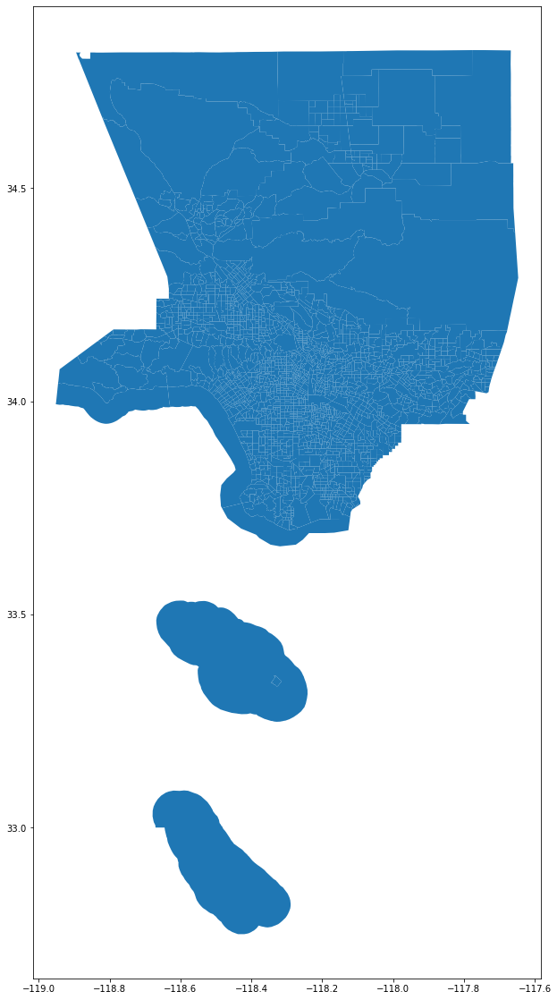

In [12]:
#plot tracts
tracts.plot(figsize=(24,20))

In [13]:
#list EJSM df with new FIPS code
list(df)

['OBJECTID',
 'Tract_1',
 'CIscore',
 'HazScore',
 'HealthScore',
 'SVscore',
 'CCVscore',
 'Shape__Area',
 'Shape__Length']

In [14]:
df.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2343 entries, 0 to 2342
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   OBJECTID       2343 non-null   int64  
 1   Tract_1        2343 non-null   object 
 2   CIscore        2343 non-null   int64  
 3   HazScore       2343 non-null   int64  
 4   HealthScore    2343 non-null   int64  
 5   SVscore        2343 non-null   int64  
 6   CCVscore       2343 non-null   int64  
 7   Shape__Area    2343 non-null   float64
 8   Shape__Length  2343 non-null   float64
dtypes: float64(2), int64(6), object(1)
memory usage: 164.9+ KB


In [15]:
#rename object Tract_1 to FIPS to match census tract data
df.columns = ['OBJECTID',
 'FIPS',
 'CIscore',
 'HazScore',
 'HealthScore',
 'SVscore',
 'CCVscore',
 'Shape__Area',
 'Shape__Length']
df.head()

,OBJECTID,FIPS,CIscore,HazScore,HealthScore,SVscore,CCVscore,Shape__Area,Shape__Length
0,1,06037920336,10,3,1,4,2,2.438560e+06,8124.373091
1,2,06037920044,4,1,1,1,1,1.470811e+06,5545.298452
2,3,06037573003,13,5,3,3,2,6.528168e+05,3310.743793
3,4,06037571704,13,3,2,4,4,6.994011e+05,4113.477175
4,5,06037570403,17,5,3,5,4,8.317839e+05,3887.000394


In [16]:
#merge data on the same object FIPS
tracts_ejsm=tracts.merge(df,on="FIPS")

In [17]:
#show merge with census data (only population)
tracts_ejsm.head()

,FIPS,geometry,OBJECTID,CIscore,HazScore,HealthScore,SVscore,CCVscore,Shape__Area,Shape__Length
0,06037101110,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007...",1464,10,3,1,3,3,1.677572e+06,5561.283410
1,06037101122,"MULTIPOLYGON (((-118.30333 34.27354, -118.3031...",672,4,1,1,1,1,3.891711e+06,11660.850429
2,06037101210,"MULTIPOLYGON (((-118.29945 34.25598, -118.2859...",1446,14,4,1,4,5,9.516179e+05,4451.778658
3,06037101220,"MULTIPOLYGON (((-118.28592 34.24896, -118.2859...",1703,12,3,1,4,4,1.026836e+06,4673.869604
4,06037101300,"MULTIPOLYGON (((-118.27247 34.23253, -118.2719...",1579,5,1,1,1,2,3.781233e+06,10813.184183


In [18]:
#describe stats by cumulative impact score
tracts_ejsm['CIscore'].describe()

count    2342.000000
mean       12.007259
std         4.352322
min         0.000000
25%         9.000000
50%        12.000000
75%        15.000000
max        20.000000
Name: CIscore, dtype: float64

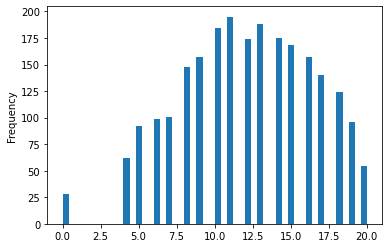

In [19]:
#plot histogram for cumulative impact score
tracts_ejsm['CIscore'].plot.hist(bins=50)

In [20]:
#describe stats by proximity to hazard score
tracts_ejsm['HazScore'].describe()

count    2342.000000
mean        2.976943
std         1.434123
min         0.000000
25%         2.000000
50%         3.000000
75%         4.000000
max         5.000000
Name: HazScore, dtype: float64

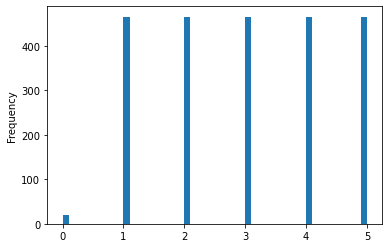

In [21]:
#plot histogram for proximity to hazard score
tracts_ejsm['HazScore'].plot.hist(bins=50)

In [22]:
#describe stats by proximity to hazard score
tracts_ejsm['SVscore'].describe()

count    2342.000000
mean        2.948335
std         1.434122
min         0.000000
25%         2.000000
50%         3.000000
75%         4.000000
max         5.000000
Name: SVscore, dtype: float64

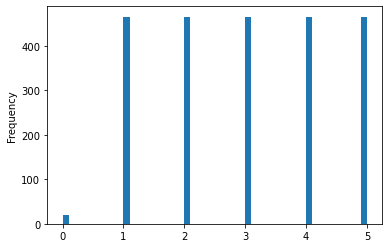

In [23]:
#plot histogram for proximity to hazard score
tracts_ejsm['HazScore'].plot.hist(bins=50)

In [24]:
#new object to show the sorted data-no difference? perhaps delete?
tracts_ejsm_sorted = tracts_ejsm.sort_values(by='CIscore',ascending = False)

In [25]:
#sorted data has no variation
tracts_ejsm_sorted[['FIPS','CIscore','HazScore','SVscore']].head(10)

,FIPS,CIscore,HazScore,SVscore
1325,06037433501,20,5,5
1530,06037530301,20,5,5
594,06037211922,20,5,5
532,06037206032,20,5,5
533,06037206050,20,5,5
660,06037219300,20,5,5
581,06037211310,20,5,5
672,06037221302,20,5,5
719,06037228900,20,5,5
1637,06037535605,20,5,5


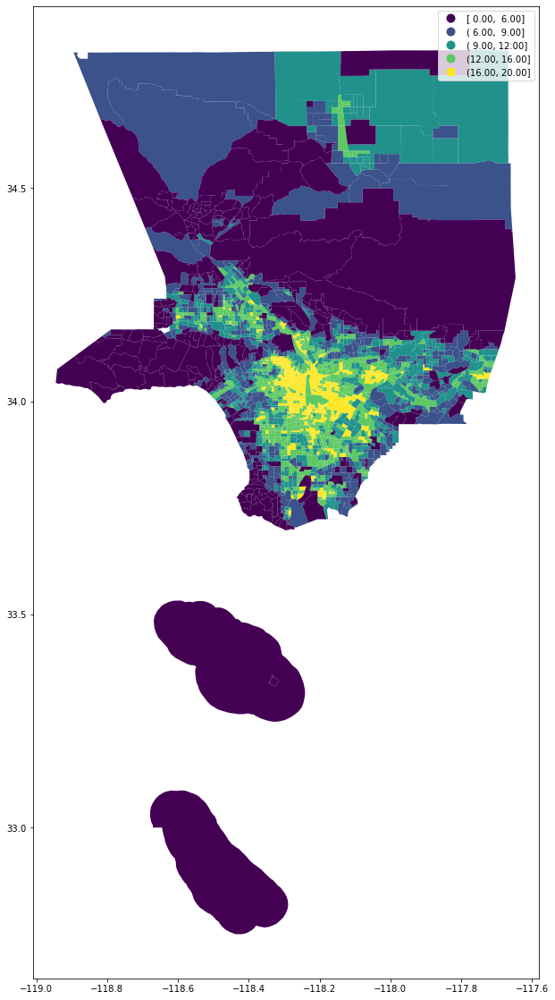

In [26]:
#plot shows the data with natural breaks
tracts_ejsm_sorted.plot(figsize=(24,20),
                 column='CIscore',
                 legend=True, 
                 scheme='NaturalBreaks')

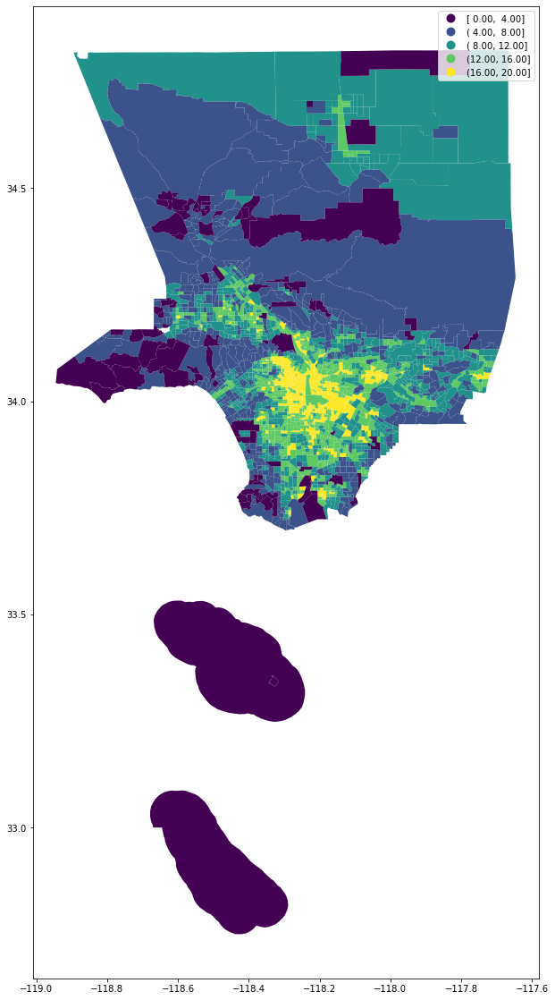

In [27]:
#equal intervalfor Cumulative Impact Score -by standard deviation 
tracts_ejsm_sorted.plot(figsize=(24,20),
                 column='CIscore',
                 legend=True, 
                 scheme='equal_interval')

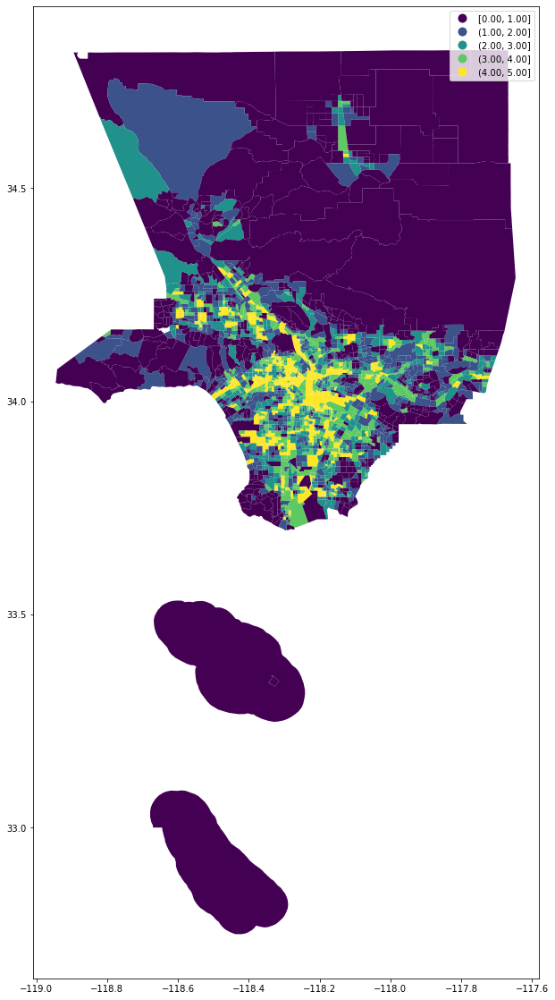

In [28]:
#equal intervalfor Proximity to Hazard Score -by standard deviation 
tracts_ejsm_sorted.plot(figsize=(24,20),
                 column='HazScore',
                 legend=True, 
                 scheme='equal_interval')

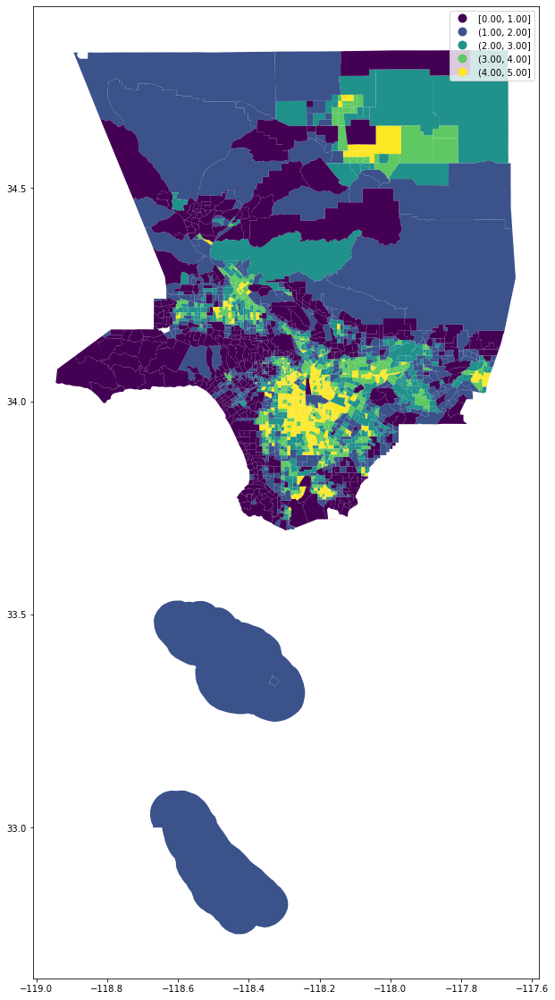

In [29]:
#equal intervalfor Social Vulnerability Score -by standard deviation 
tracts_ejsm_sorted.plot(figsize=(24,20),
                 column='SVscore',
                 legend=True, 
                 scheme='equal_interval')

In [30]:
import folium

In [31]:
# laid out the map for cumulative score. Could not continue due to memory passing threshold, but had added population and poverty data by census that we were unable to use at this point
m = folium.Map(location=[34.2,-118.2], 
               zoom_start = 9,
               tiles='CartoDB positron', 
               attribution='CartoDB')

# plot chorpleth over the base map
folium.Choropleth(
                  geo_data=tracts_ejsm, # geo data
                  data=tracts_ejsm, # data          
                  key_on='feature.properties.FIPS', # key, or merge column
                  columns=['FIPS', 'CIscore'], # [key, value]
                  fill_color='BuPu',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2, # line opacity (of the border)
                  legend_name='Degree of Cumulative Impact of Environmenta Hazards)').add_to(m)    # name on the legend color bar
m

In [32]:
# This project reflects the concentration of environmental hazards and vulnerability by census tract,
# reflecting across various index values, the concentration of environmental issues in South, Central, and East Los Angeles
#Danielle Hoague-figured out zero dilemma for data; ran spatial analysis and distribution of index by census tracts;  laid out markdown text and story 
#Andres Gonzalez-Merged and sorted data by FIPS; ran anaylsis for HazScore and SVscore; final map

In [33]:
import plotly.express as px
from sodapy import Socrata

In [34]:
client = Socrata("data.lacity.org", None)
results = client.get("amvf-fr72", limit=10000)
df =pd.DataFrame.from_records(results)

In [35]:
df.sample(5)

,rpt_id,report_type,arst_date,time,area,area_desc,rd,age,sex_cd,descent_cd,...,:@computed_region_kqwf_mjcx,:@computed_region_2dna_qi2s,chrg_grp_cd,grp_description,chrg_desc,crsst,bkg_date,bkg_time,bgk_location,bkg_loc_cd
3437,5966096,BOOKING,2020-07-04T00:00:00.000,2313,14,Pacific,1494,31,M,B,...,10,16,08,Other Assaults,OBSTRUCT/ETC PUB OFCR/ETC,NASH ST,2020-07-05T00:00:00.000,0029,PACIFIC,4214
1854,5960532,BOOKING,2020-06-25T00:00:00.000,0710,08,West LA,0857,46,M,B,...,6,95,05,Burglary,BURGLARY,NaN,2020-06-25T00:00:00.000,1248,METRO - JAIL DIVISION,4273
6128,5972626,BOOKING,2020-07-15T00:00:00.000,1930,03,Southwest,0396,34,M,H,...,13,2,07,Vehicle Theft,TAKE VEHICLE W/O OWNER'S CONSENT,NaN,2020-07-15T00:00:00.000,2132,77TH ST,4212
6953,5846568,BOOKING,2020-01-13T00:00:00.000,1100,12,77th Street,1256,36,M,H,...,14,NaN,07,Vehicle Theft,TAKE VEHICLE W/O OWNER'S CONSENT,HOOVER,2020-01-13T00:00:00.000,1649,77TH ST,4212
6978,200511847,RFC,2020-06-24T00:00:00.000,0750,05,Harbor,0566,27,M,H,...,15,36,NaN,NaN,NaN,BEACON ST,NaN,NaN,NaN,NaN


In [36]:
df.grp_description.unique()

array([nan, 'Liquor Laws', 'Drunkeness', 'Aggravated Assault',
       'Driving Under Influence', 'Prostitution/Allied',
       'Narcotic Drug Laws', 'Robbery', 'Burglary', 'Disorderly Conduct',
       'Gambling', 'Other Assaults', 'Miscellaneous Other Violations',
       'Against Family/Child', 'Fraud/Embezzlement', 'Vehicle Theft',
       'Weapon (carry/poss)', 'Moving Traffic Violations',
       'Forgery/Counterfeit', 'Homicide', 'Receive Stolen Property',
       'Non-Criminal Detention', 'Larceny', 'Sex (except rape/prst)',
       'Rape', 'Disturbing the Peace', 'Pre-Delinquency'], dtype=object)

In [37]:
arrest_by_charge = df.grp_description.value_counts().reset_index()
arrest_by_charge

,index,grp_description
0,Aggravated Assault,1567
1,Miscellaneous Other Violations,1383
2,Driving Under Influence,995
3,Other Assaults,882
4,Narcotic Drug Laws,866
5,Vehicle Theft,661
6,Weapon (carry/poss),519
7,Burglary,452
8,Robbery,329
9,Larceny,255


In [38]:
df.arst_typ_cd.unique()

array(['M', 'I', 'F', 'D', 'O'], dtype=object)

In [39]:
arrest_by_type = df.arst_typ_cd.value_counts().reset_index()
arrest_by_type

,index,arst_typ_cd
0,F,5554
1,M,3723
2,I,562
3,O,82
4,D,79


In [40]:
crime = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.lon, df.lat))

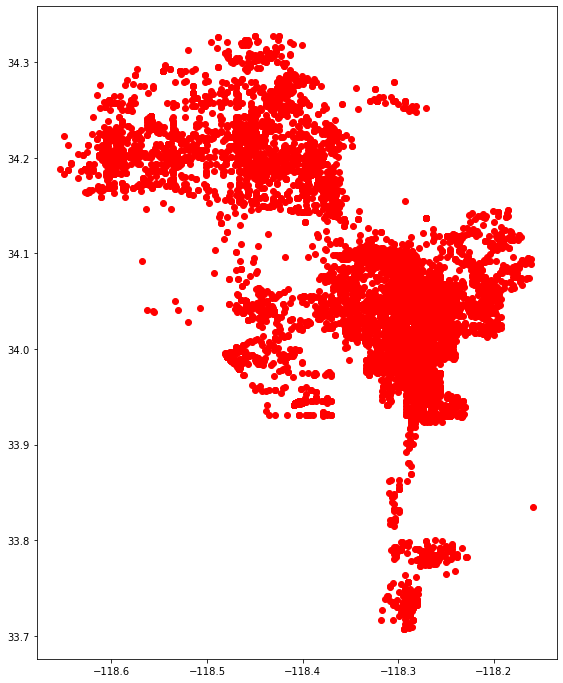

In [41]:
crime.plot(figsize=(12,12),color='red')

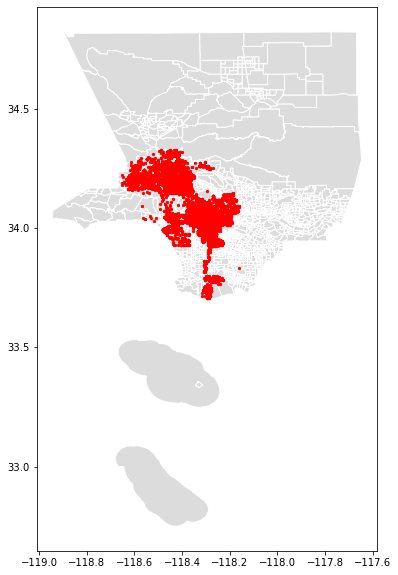

In [42]:
base = tracts_ejsm_sorted.plot(figsize=(12,10),color='gainsboro', edgecolor='white')

ax = crime.plot(ax=base, color='red', markersize=5)

In [43]:
crime.set_crs(epsg=4326, inplace=True)
crime.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [44]:
tracts.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [45]:
join = gpd.sjoin(tracts,
                 crime,
                 how='right')

In [46]:
join.head()

,index_left,FIPS,rpt_id,report_type,arst_date,time,area,area_desc,rd,age,...,:@computed_region_2dna_qi2s,chrg_grp_cd,grp_description,chrg_desc,crsst,bkg_date,bkg_time,bgk_location,bkg_loc_cd,geometry
3526,0.0,06037101110,6005984,BOOKING,2020-09-04T00:00:00.000,2250,16,Foothill,1656,24,...,7,22,Driving Under Influence,DRUNK DRIVING ALCOHOL/DRUGS,NaN,2020-09-05T00:00:00.000,0218,VALLEY - JAIL DIV,4279,POINT (-118.30020 34.25670)
5121,0.0,06037101110,6009503,BOOKING,2020-09-10T00:00:00.000,1030,16,Foothill,1638,39,...,7,08,Other Assaults,BATT EX-SPOUSE/FIANCEE/PERSN W/DATING REL,NaN,2020-09-10T00:00:00.000,1410,VALLEY - JAIL DIV,4279,POINT (-118.29320 34.25780)
4521,0.0,06037101110,5993355,BOOKING,2020-08-16T00:00:00.000,2220,16,Foothill,1638,20,...,7,24,Miscellaneous Other Violations,KIDNAPPING,MT GLEASON,2020-08-17T00:00:00.000,0201,VALLEY - JAIL DIV,4279,POINT (-118.29300 34.25950)
8830,0.0,06037101110,5979399,BOOKING,2020-07-27T00:00:00.000,0130,16,Foothill,1638,44,...,7,08,Other Assaults,BATT EX-SPOUSE/FIANCEE/PERSN W/DATING REL,NaN,2020-07-27T00:00:00.000,0311,VALLEY - JAIL DIV,4279,POINT (-118.29300 34.25950)
1235,0.0,06037101110,5960579,BOOKING,2020-06-25T00:00:00.000,1200,16,Foothill,1638,28,...,7,08,Other Assaults,TERRORIZE CAUSING FEAR,NaN,2020-06-25T00:00:00.000,1440,VALLEY - JAIL DIV,4279,POINT (-118.29300 34.25950)


In [47]:
crime_by_tracts = join.FIPS.value_counts().rename_axis('Tract').reset_index(name='crime_count')

In [48]:
crime_by_tracts.head()

,Tract,crime_count
0,06037980028,227
1,06037273402,135
2,06037206300,108
3,06037237600,102
4,06037190700,89


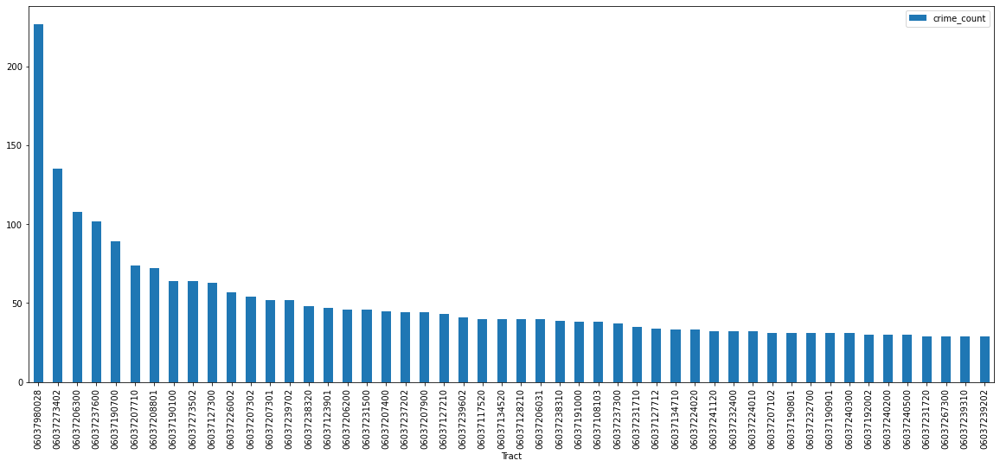

In [49]:
crime_by_tracts[:50].plot.bar(figsize=(20,8),x='Tract',y='crime_count')

In [50]:
join.groupby(['grp_description']).count()

,index_left,FIPS,rpt_id,report_type,arst_date,time,area,area_desc,rd,age,...,:@computed_region_kqwf_mjcx,:@computed_region_2dna_qi2s,chrg_grp_cd,chrg_desc,crsst,bkg_date,bkg_time,bgk_location,bkg_loc_cd,geometry
grp_description,,,,,,,,,,,,,,,,,,,,,
Against Family/Child,101,101,101,101,101,101,101,101,101,101,...,101,95,101,101,8,100,100,100,100,101
Aggravated Assault,1567,1567,1576,1576,1576,1576,1576,1576,1576,1576,...,1574,1510,1576,1576,421,1576,1576,1576,1576,1576
Burglary,455,455,455,455,455,455,455,455,455,455,...,453,442,455,455,148,455,455,454,454,455
Disorderly Conduct,36,36,36,36,36,36,36,36,36,36,...,36,35,36,36,18,18,18,18,18,36
Disturbing the Peace,5,5,5,5,5,5,5,5,5,5,...,5,5,5,5,1,1,1,1,1,5
Driving Under Influence,992,992,999,999,999,999,999,999,999,999,...,997,956,999,999,852,998,998,998,998,999
Drunkeness,166,166,166,166,166,166,166,166,166,166,...,164,157,166,166,128,6,6,6,6,166
Forgery/Counterfeit,32,32,32,32,32,32,32,32,32,32,...,32,31,32,32,13,29,29,29,29,32
Fraud/Embezzlement,59,59,61,61,61,61,61,61,61,61,...,61,61,61,61,28,59,59,59,59,61


In [51]:
join_grouped=join.groupby(['FIPS','grp_description','lat','lon','arst_date']).count()[['rpt_id']]
join_grouped.head(50)

rpt_id
FIPS        grp_description                lat     lon       arst_date                      
06037101110 Driving Under Influence        34.2567 -118.3002 2020-09-04T00:00:00.000       1
            Miscellaneous Other Violations 34.2595 -118.293  2020-08-16T00:00:00.000       1
            Other Assaults                 34.2578 -118.2932 2020-09-10T00:00:00.000       1
                                           34.2595 -118.293  2020-06-25T00:00:00.000       1
                                                             2020-07-27T00:00:00.000       1
06037101210 Aggravated Assault             34.2523 -118.2874 2020-06-21T00:00:00.000       1
                                                             2020-07-15T00:00:00.000       1
                                                   -118.2932 2020-06-19T00:00:00.000       1
                                           34.2544 -118.286  2020-07-26T00:00:00.000       1
06037101220 Aggravated Assault             34.252  -118.2835 2020-07-01T00:00:00.000       1
                                           34.2539 -118.2814 2020-09-19T00:00:00.000       1
            Burglary                       34.2478 -118.2818 2020-07-27T00:00:00.000       1
            Miscellaneous Other Violations 34.25   -118.2846 2020-07-29T00:00:00.000       1
06037101300 Aggravated Assault             34.2519 -118.2713 2020-06-24T00:00:00.000       1
06037101400 Narcotic Drug Laws             34.2486 -118.2886 2020-05-17T00:00:00.000       1
            Other Assaults                 34.252  -118.2955 2020-06-22T00:00:00.000       1
06037102103 Driving Under Influence        34.2268 -118.3631 2020-09-17T00:00:00.000       1
            Narcotic Drug Laws             34.2237 -118.3547 2020-07-05T00:00:00.000       1
            Other Assaults                 34.2219 -118.3584 2020-08-14T00:00:00.000       1
            Weapon (carry/poss)            34.2268 -118.3631 2020-07-18T00:00:00.000       1
06037102104 Driving Under Influence        34.2127 -118.3485 2020-08-15T00:00:00.000       1
            Narcotic Drug Laws             34.2201 -118.3489 2020-06-28T00:00:00.000       1
            Vehicle Theft                  34.2123 -118.3485 2020-04-18T00:00:00.000       1
06037102107 Aggravated Assault             34.2397 -118.3661 2020-07-04T00:00:00.000       1
            Larceny                        34.2512 -118.3421 2020-07-27T00:00:00.000       1
06037103102 Driving Under Influence        34.2633 -118.3157 2020-06-29T00:00:00.000       1
            Larceny                        34.2634 -118.3074 2020-01-31T00:00:00.000       1
06037103200 Aggravated Assault             34.2724 -118.3243 2020-08-16T00:00:00.000       1
            Gambling                       34.2598 -118.3224 2020-09-17T00:00:00.000       9
            Larceny                        34.2724 -118.3243 2020-09-17T00:00:00.000       1
            Narcotic Drug Laws             34.2598 -118.3224 2020-09-12T00:00:00.000       1
                                           34.2615 -118.3258 2020-09-17T00:00:00.000       1
                                           34.2732 -118.3443 2020-07-02T00:00:00.000       1
            Other Assaults                 34.2598 -118.3297 2020-06-23T00:00:00.000       1
                                           34.2634 -118.3201 2020-07-01T00:00:00.000       1
            Vehicle Theft                  34.2598 -118.3297 2020-06-23T00:00:00.000       1
                                           34.2615 -118.3214 2020-09-23T00:00:00.000       1
            Weapon (carry/poss)            34.2724 -118.3243 2020-07-06T00:00:00.000       1
06037103300 Driving Under Influence        34.2562 -118.3588 2020-07-04T00:00:00.000       1
            Vehicle Theft                  34.2562 -118.3588 2020-07-30T00:00:00.000       1
06037103400 Miscellaneous Other Violations 34.2596 -118.3052 2020-07-01T00:00:00.000       1
            Narcotic Drug Laws             34.2596 -118.3038 2020-07-04T00:00:00.000   

In [52]:
df_flat = join_grouped.reset_index()
df_flat

,FIPS,grp_description,lat,lon,arst_date,rpt_id
0,06037101110,Driving Under Influence,34.2567,-118.3002,2020-09-04T00:00:00.000,1
1,06037101110,Miscellaneous Other Violations,34.2595,-118.293,2020-08-16T00:00:00.000,1
2,06037101110,Other Assaults,34.2578,-118.2932,2020-09-10T00:00:00.000,1
3,06037101110,Other Assaults,34.2595,-118.293,2020-06-25T00:00:00.000,1
4,06037101110,Other Assaults,34.2595,-118.293,2020-07-27T00:00:00.000,1
...,...,...,...,...,...,...
8550,06037980031,Receive Stolen Property,33.7489,-118.2798,2020-06-05T00:00:00.000,1
8551,06037980031,Sex (except rape/prst),33.7613,-118.2819,2020-06-20T00:00:00.000,1
8552,06037980031,Vehicle Theft,33.7167,-118.2842,2020-06-25T00:00:00.000,1
8553,06037980031,Weapon (carry/poss),33.7489,-118.2798,2020-07-01T00:00:00.000,1


In [53]:
px.bar(df_flat,
       x='grp_description',
       y='rpt_id'
      )

In [54]:
df_ejsm_crime_tracts = tracts_ejsm.merge(df_flat,on="FIPS")

In [55]:
df_ejsm_crime_tracts.head

<bound method NDFrame.head of              FIPS                                           geometry  \
0     06037101110  MULTIPOLYGON (((-118.30229 34.25870, -118.3007...   
1     06037101110  MULTIPOLYGON (((-118.30229 34.25870, -118.3007...   
2     06037101110  MULTIPOLYGON (((-118.30229 34.25870, -118.3007...   
3     06037101110  MULTIPOLYGON (((-118.30229 34.25870, -118.3007...   
4     06037101110  MULTIPOLYGON (((-118.30229 34.25870, -118.3007...   
...           ...                                                ...   
8546  06037980031  MULTIPOLYGON (((-118.28530 33.70860, -118.2833...   
8547  06037980031  MULTIPOLYGON (((-118.28530 33.70860, -118.2833...   
8548  06037980031  MULTIPOLYGON (((-118.28530 33.70860, -118.2833...   
8549  06037980031  MULTIPOLYGON (((-118.28530 33.70860, -118.2833...   
8550  06037980033  MULTIPOLYGON (((-118.24463 33.71077, -118.2318...   

      OBJECTID  CIscore  HazScore  HealthScore  SVscore  CCVscore  \
0         1464       10         3   

In [56]:
df_ejsm_crime_tracts['lat'] = df_ejsm_crime_tracts['lat'].astype(float)
df_ejsm_crime_tracts['lon'] = df_ejsm_crime_tracts['lon'].astype(float)
df_ejsm_crime_tracts.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 8551 entries, 0 to 8550
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   FIPS             8551 non-null   object  
 1   geometry         8551 non-null   geometry
 2   OBJECTID         8551 non-null   int64   
 3   CIscore          8551 non-null   int64   
 4   HazScore         8551 non-null   int64   
 5   HealthScore      8551 non-null   int64   
 6   SVscore          8551 non-null   int64   
 7   CCVscore         8551 non-null   int64   
 8   Shape__Area      8551 non-null   float64 
 9   Shape__Length    8551 non-null   float64 
 10  grp_description  8551 non-null   object  
 11  lat              8551 non-null   float64 
 12  lon              8551 non-null   float64 
 13  arst_date        8551 non-null   object  
 14  rpt_id           8551 non-null   int64   
dtypes: float64(4), geometry(1), int64(7), object(3)
memory usage: 1.0+ MB


In [57]:
px.scatter(df_ejsm_crime_tracts,
           x='lon',
           y='lat'
          )

In [58]:
df_ejsm_crime_tracts.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [59]:
fig = px.scatter_mapbox(df_ejsm_crime_tracts,
                        lat='lat',
                        lon='lon',
                        mapbox_style="stamen-terrain")
fig.show()

In [60]:
fig = px.scatter_mapbox(df_ejsm_crime_tracts, 
                        lat="lat", 
                        lon="lon", 
                        color="grp_description",
                        animation_frame = 'arst_date',
                       )
fig.update_layout(mapbox_style="carto-darkmatter")

fig.show()

In [61]:
from keplergl import KeplerGl

In [62]:
map = KeplerGl(height=600,width=800)
map

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(height=600)

In [63]:
map.add_data(data=df_ejsm_crime_tracts,name='Ejsm')

In [64]:
map.save_to_html(file_name='la_arrests.html',read_only=True)

Map saved to la_arrests.html!
